In [ ]:

# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'train-images:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4888051%2F8240202%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240501%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240501T164338Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D1033d51aee198a03ff1c45421c5ce602ab94da381a07ccb6c60e495c1d143fc4f04cff6e527b9095c4b0e181180ea1c7020676da55be6eb5698fe7652af371f591a6ba8f65fafd07ed33c0d275629db89e9e316727f9c532c6d1b454e9955ca98c681f1c53cfe4cc1beffdb8c80d4ff146fd52bd79923cfd9ca7b91070b90663bfa80ad8262cb00d6f41b4f2b987adf7708515d69a12cdfc3c8436537bf89221b9749c3fd23c232c4fe173842ce34de295647828a55e902e3da24fd458c2cbcce95dc264b82ae0071fc5eec6eba8218dd481b61b75c7cab3cd5bc4d25aedb3f6b76ddff46791f636024a2bbae2513b6567ff22b4987564062efe971b0d9f7810,assignment-5:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4888065%2F8240217%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240501%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240501T164338Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D3d63d62995feec9b77a051b5c0bbc4b075e43c1ac99b1e09bfe48d919beb8a60b86783f23955a245bd90153ab24a27012e641808d13d4f2d6219ff8cb69b2dea11eba0961470bc40321e89203a0d1bb65f0d701fd687c3f211aa55e13351dbea8e9ea07429e2c5798f2e98127dd8269f5973de2c7868d7740c73158a74ca2a1abd8388d35e4562a8961fc0b18dd56d5212f4d05ccd25b37745c372c9518028a4cab492fcefb7f829021a5c2dabd7cf3d63c78ab07e6f78d161be34e311e2717daa696e3d16bb3e8a551c024d72863a3ddfc2000fa547381c3cfb308fc092e76522b744c5c70de98a234db50456c45b7cbd7c952742cdb181b319cb965fbc10b7,vqvae-weights:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4917250%2F8280097%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240501%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240501T164338Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D3b2811dd83768e721d75889a2c940c484b7f7b573141adb338a3928803090b8520aaf996a95920c72a9039cd4da5ccfd92523063af05b160a933dce8fbeb261656a8b170e81e1e80d44fa186d49cb21a58c1e9c61d813ae5095216307b03628b89074eb7740a985372eb54c16a5ebbc4901e917daddee9179fca91b7ec6ad37ce15f5d3ae2e5850cffa36c881f20f4b5761b43c45a780437d1b5eff35f57552ec5db1871e8598ed5af56fd06c28a32383edd9128843f093f46d6e36df1d7bd7e52252a65cfe3f2df780c37c1efe3e2545d888839849c43e2897fcc31397a3c0cc622306063b38bf0e453f7d8e2fb57032f526807fa953d2f38451cd74bd6c637,vqvae-wt:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4919351%2F8282945%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240501%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240501T164338Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D2dc038e7a94d4b2b2225f735f306bb16f6c96632a946585b63025339fc41c9b64884d92472ac2201bd3e820d36089ed90b4491ddd1485380e06e4d9b2da1ce29e11364a16700406e0411617f9f36fb48a05c04a6d8c04c5b267c75811bb666ace93ac56e31aebe40d738bdb281a0fcc837ecbd956fdac74b7d3063f2875f6b16715bc6426dae183f55dcf788578098465b99cfbd0b0c9c263aba7765d8278c2831da143200326124a3229d23dab3a1f9356cbd9ba5c1869da9a3720a9208656ffd235a2d1b770c8459f0e02f5dc7ce7a911421ee531d6b2a5d0a2bc5a7534437613b20cc9fd75ce45f9806c02476438d5339d0b91fdbbf9609a8032eab3d6a13'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


[==================================================] 2482119533 bytes downloaded
Downloaded and uncompressed: train-images
[==================================================] 365067743 bytes downloaded
Downloaded and uncompressed: assignment-5
[==================================================] 1976373 bytes downloaded
Downloaded and uncompressed: vqvae-weights
[==================================================] 1972683 bytes downloaded
Downloaded and uncompressed: vqvae-wt
Data source import complete.


# **VAE**
______________________________________

**Import Libraries and Dataset:**
_____

In [ ]:
!pip install wandb

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torch import nn
from torch.optim import Adam
import torch.nn.functional as F
import wandb
import os
from PIL import Image
import pandas as pd
from torch.utils.data import Dataset

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
wandb.init(project="Assignmet-5", entity="M23CSA013")

<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

 ··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


**Preprocess the Dataset:**
____

In [ ]:
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

In [ ]:
class SketchDataset(Dataset):
    def __init__(self, data_folder, transform=None):
        self.data_folder = data_folder
        self.image_filenames = os.listdir(data_folder)
        self.transform = transform

    def __len__(self):
        return len(self.data_folder)

    def __getitem__(self, idx):
        img_name = os.path.join(self.data_folder, self.image_filenames[idx])
        image = Image.open(img_name).convert('RGB')

        if self.transform:
            image = self.transform(image)
        return image

In [ ]:
train_dataset = SketchDataset(data_folder='/kaggle/input/train-images/Train_data',
                              transform=transform)

In [ ]:
test_dataset = SketchDataset(data_folder='/kaggle/input/assignment-5/Assignment_4/Test/Test_data/Test_data',
                              transform=transform)

In [ ]:
pixel_values = []
# count = 0
for img in train_dataset:
  # if count == 1000:
  #   break
  img_tensor = torch.flatten(img)
  pixel_values.extend(img_tensor.numpy())
  # count = count + 1
pixel_values_tensor = torch.tensor(pixel_values)
data_variance = torch.var(pixel_values_tensor)
pixel_values = []

**Visualizing the Dataset:**
____

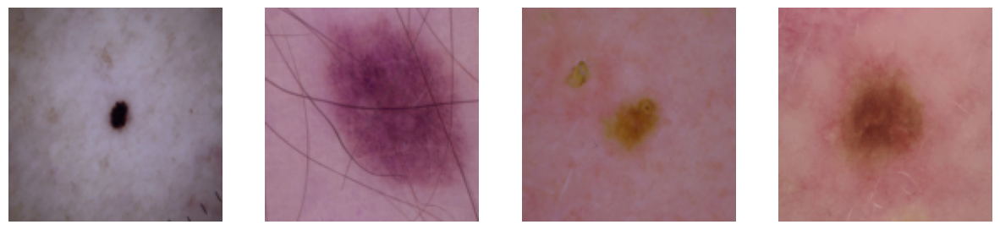

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def imageshow(inp, title=None):
    inp = inp.numpy().transpose((0, 2, 3, 1))
    mean = np.array([0.5, 0.5, 0.5])
    std = np.array([0.5, 0.5, 0.5])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)

    fig, axs = plt.subplots(1, inp.shape[0], figsize=(15, 5))
    for i in range(inp.shape[0]):
        axs[i].imshow(inp[i])
        axs[i].axis('off')
        if title is not None:
            axs[i].set_title(title[i])
    plt.show()

train_loader = DataLoader(train_dataset, batch_size = 4)

for i, batch in enumerate(train_loader):
    images = batch
    imageshow(images)
    break

In [ ]:
images[0].shape

torch.Size([3, 128, 128])

**Architecture for Vector Quantizer:**
______

In [ ]:
class VectorQuantizer(nn.Module):
    def __init__(self, num_embeddings, embedding_dim, commitment_cost):
        super(VectorQuantizer, self).__init__()

        self._embedding_dim = embedding_dim
        self._num_embeddings = num_embeddings

        self._embedding = nn.Embedding(self._num_embeddings, self._embedding_dim)
        self._embedding.weight.data.uniform_(-1/self._num_embeddings, 1/self._num_embeddings)
        self._commitment_cost = commitment_cost

    def forward(self, inputs):
        inputs = inputs.permute(0, 2, 3, 1).contiguous()
        input_shape = inputs.shape

        flat_input = inputs.view(-1, self._embedding_dim)

        distances = (torch.sum(flat_input**2, dim=1, keepdim=True)
                    + torch.sum(self._embedding.weight**2, dim=1)
                    - 2 * torch.matmul(flat_input, self._embedding.weight.t()))

        encoding_indices = torch.argmin(distances, dim=1).unsqueeze(1)
        encodings = torch.zeros(encoding_indices.shape[0], self._num_embeddings, device=inputs.device)
        encodings.scatter_(1, encoding_indices, 1)

        quantized = torch.matmul(encodings, self._embedding.weight).view(input_shape)

        e_latent_loss = F.mse_loss(quantized.detach(), inputs)
        q_latent_loss = F.mse_loss(quantized, inputs.detach())
        loss = q_latent_loss + self._commitment_cost * e_latent_loss

        quantized = inputs + (quantized - inputs).detach()
        avg_probs = torch.mean(encodings, dim=0)
        perplexity = torch.exp(-torch.sum(avg_probs * torch.log(avg_probs + 1e-10)))

        return loss, quantized.permute(0, 3, 1, 2).contiguous(), perplexity, encodings

**Encoder and Decoder Architecture:**
___

In [ ]:
class Encoder(nn.Module):
    def __init__(self, in_channels, num_hiddens):
        super(Encoder, self).__init__()

        self._conv_1 = nn.Conv2d(in_channels=in_channels,
                                 out_channels=num_hiddens//2,
                                 kernel_size=4,
                                 stride=2, padding=1)
        self._conv_2 = nn.Conv2d(in_channels=num_hiddens//2,
                                 out_channels=num_hiddens,
                                 kernel_size=4,
                                 stride=2, padding=1)
        self._conv_3 = nn.Conv2d(in_channels=num_hiddens,
                                 out_channels=num_hiddens,
                                 kernel_size=3,
                                 stride=1, padding=1)

    def forward(self, inputs):
        x = self._conv_1(inputs)
        x = F.relu(x)

        x = self._conv_2(x)
        x = F.relu(x)

        x = self._conv_3(x)
        return x

In [ ]:
class Decoder(nn.Module):
    def __init__(self, in_channels, num_hiddens):
        super(Decoder, self).__init__()

        self._conv_1 = nn.Conv2d(in_channels=in_channels,
                                 out_channels=num_hiddens,
                                 kernel_size=3,
                                 stride=1, padding=1)

        self._conv_trans_1 = nn.ConvTranspose2d(in_channels=num_hiddens,
                                                out_channels=num_hiddens//2,
                                                kernel_size=4,
                                                stride=2, padding=1)

        self._conv_trans_2 = nn.ConvTranspose2d(in_channels=num_hiddens//2,
                                                out_channels=3,
                                                kernel_size=4,
                                                stride=2, padding=1)

    def forward(self, inputs):
        x = self._conv_1(inputs)

        x = self._conv_trans_1(x)
        x = F.relu(x)

        return self._conv_trans_2(x)

In [ ]:
batch_size = 128
num_training_updates = 25000

num_hiddens = 128

embedding_dim = 64
num_embeddings = 512

commitment_cost = 0.25

decay = 0.99

learning_rate = 1e-3

**VQ-VAE model:**
___

In [ ]:
class Model(nn.Module):
    def __init__(self, num_hiddens, embedding_dim,
                 commitment_cost, decay=0):

        super(Model, self).__init__()

        self._pre_vq_conv = nn.Conv2d(in_channels=num_hiddens,
                                      out_channels=embedding_dim,
                                      kernel_size=1,
                                      stride=1)

        self._encoder = Encoder(3, num_hiddens)

        self._vq_vae = VectorQuantizer(num_embeddings, embedding_dim,
                                           commitment_cost)

        self._decoder = Decoder(embedding_dim, num_hiddens)

    def forward(self, x):
        z = self._encoder(x)
        z = self._pre_vq_conv(z)
        loss, quantized, perplexity, _ = self._vq_vae(z)
        x_recon = self._decoder(quantized)
        return loss, x_recon, perplexity

In [ ]:
model = Model(num_hiddens, embedding_dim, commitment_cost, decay).to(device)

In [ ]:
optimizer = Adam(model.parameters(), lr=learning_rate, amsgrad=False)

**Training Loop:**
___

In [ ]:
train_loader = DataLoader(train_dataset, batch_size = batch_size, shuffle=True)

1000 iterations
recon_error: 0.165
perplexity: 7.745



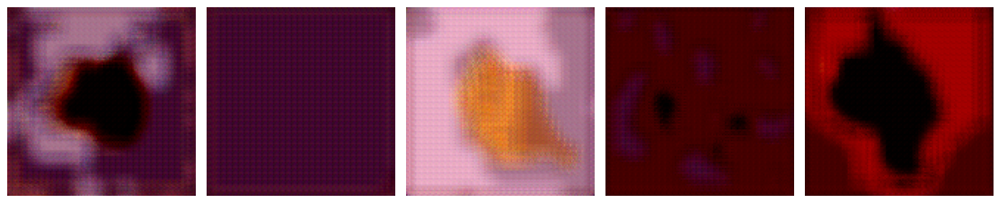

2000 iterations
recon_error: 0.055
perplexity: 31.662



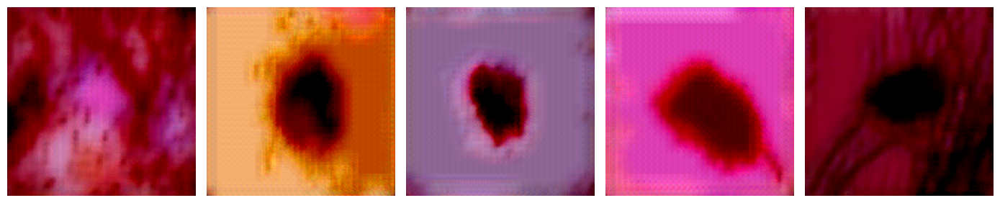

3000 iterations
recon_error: 0.031
perplexity: 67.465



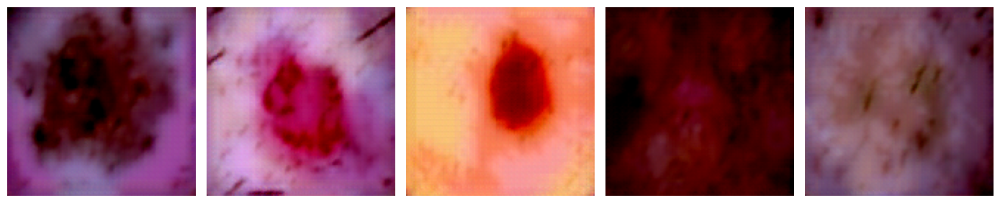

4000 iterations
recon_error: 0.023
perplexity: 96.814



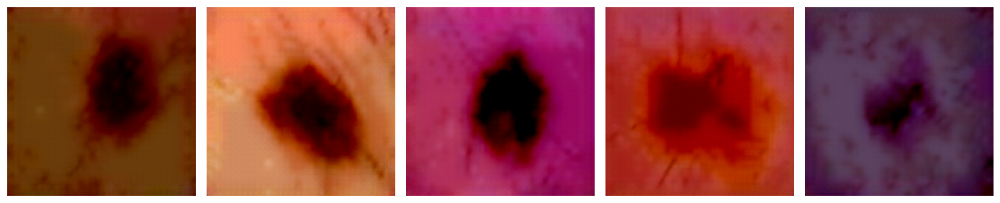

5000 iterations
recon_error: 0.021
perplexity: 120.782



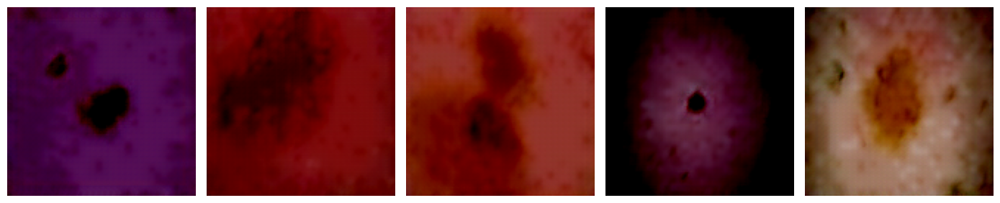

6000 iterations
recon_error: 0.549
perplexity: 2.990



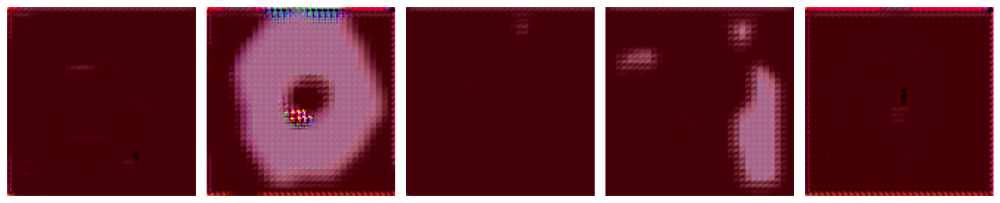

7000 iterations
recon_error: 0.244
perplexity: 9.523



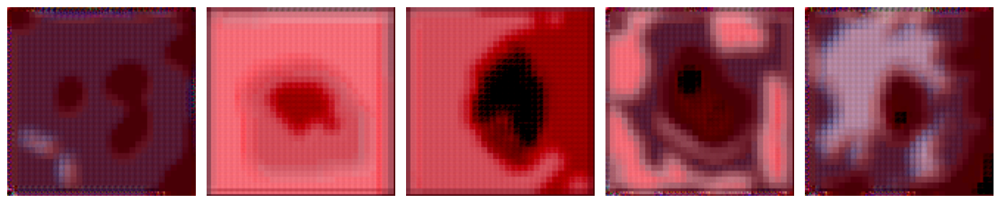

8000 iterations
recon_error: 0.155
perplexity: 19.562



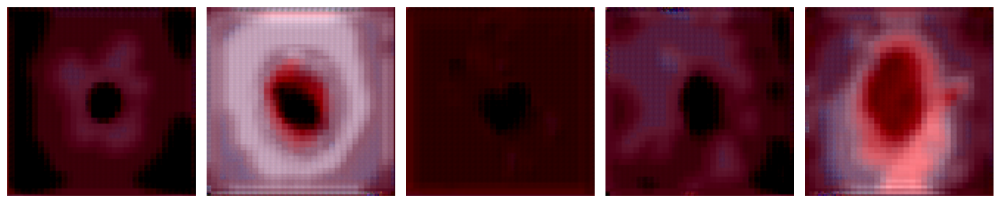

9000 iterations
recon_error: 0.128
perplexity: 27.837



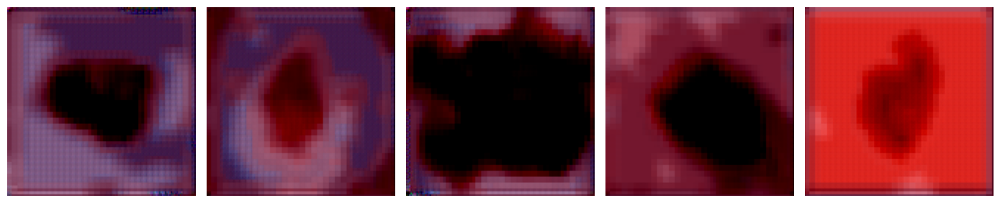

10000 iterations
recon_error: 0.115
perplexity: 34.385



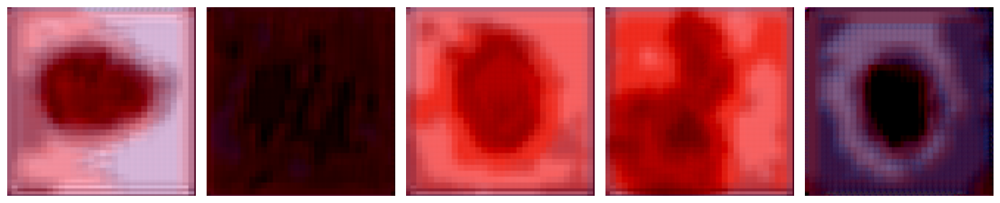

11000 iterations
recon_error: 0.110
perplexity: 39.417



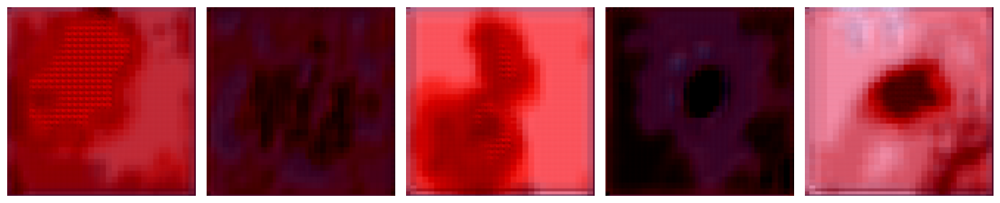

12000 iterations
recon_error: 0.101
perplexity: 44.283



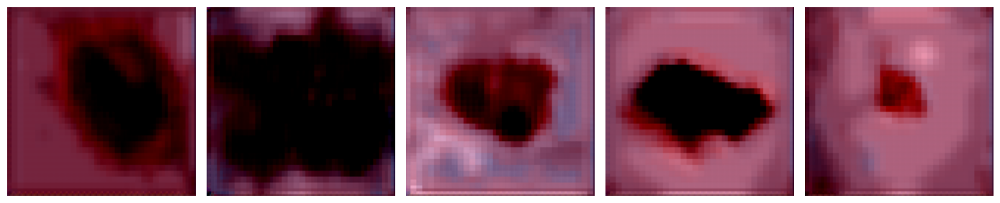

13000 iterations
recon_error: 0.093
perplexity: 45.555



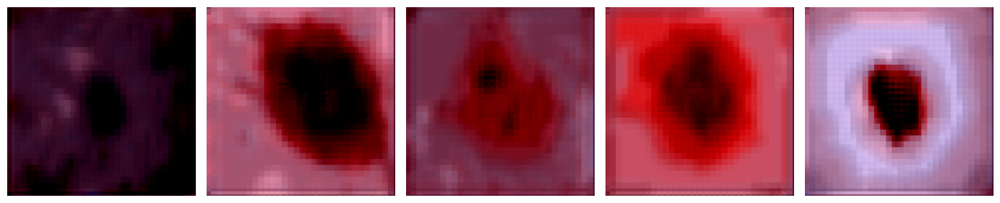

14000 iterations
recon_error: 0.087
perplexity: 49.735



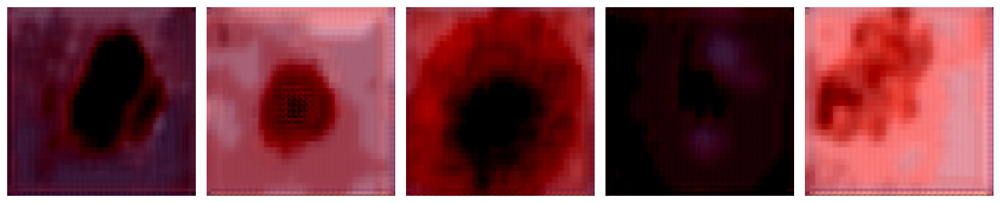

15000 iterations
recon_error: 0.083
perplexity: 53.812



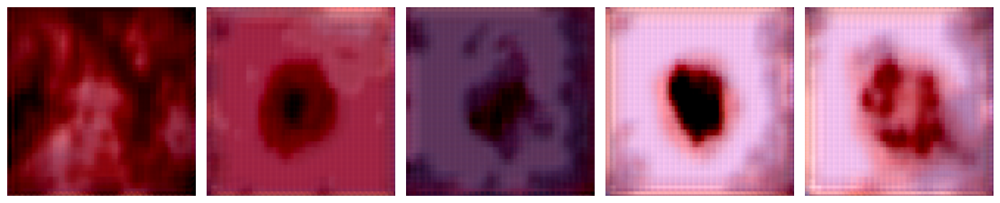

16000 iterations
recon_error: 0.074
perplexity: 51.461



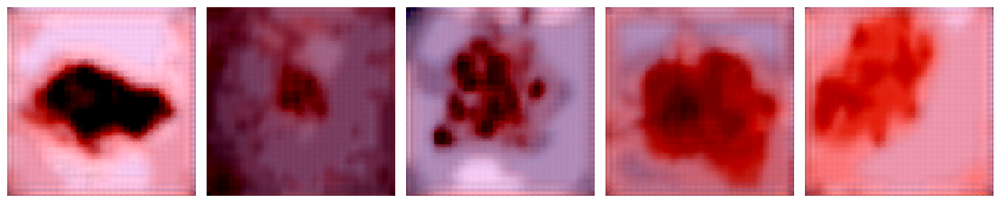

17000 iterations
recon_error: 0.054
perplexity: 58.559



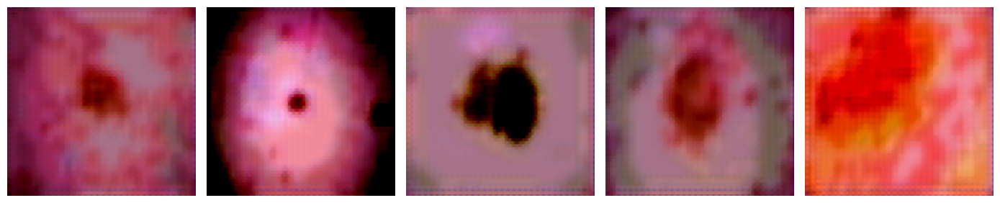

18000 iterations
recon_error: 0.044
perplexity: 61.102



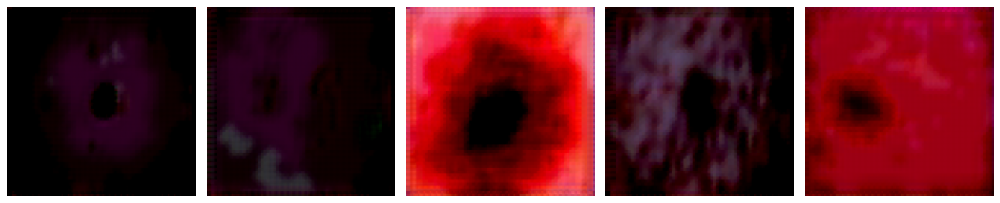

19000 iterations
recon_error: 0.040
perplexity: 61.760



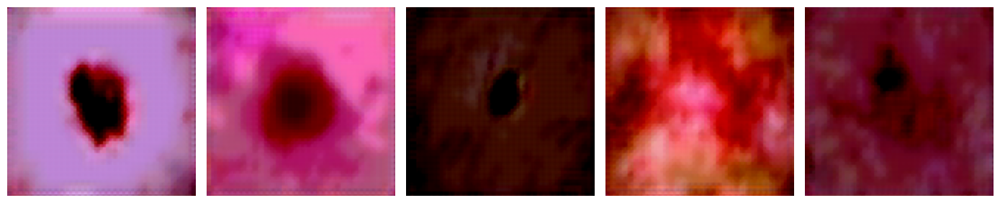

20000 iterations
recon_error: 0.038
perplexity: 65.492



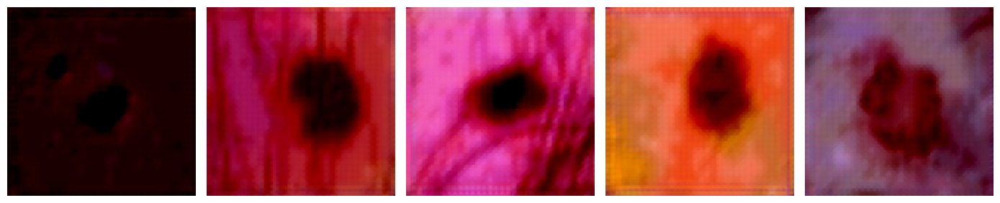

21000 iterations
recon_error: 0.032
perplexity: 71.822



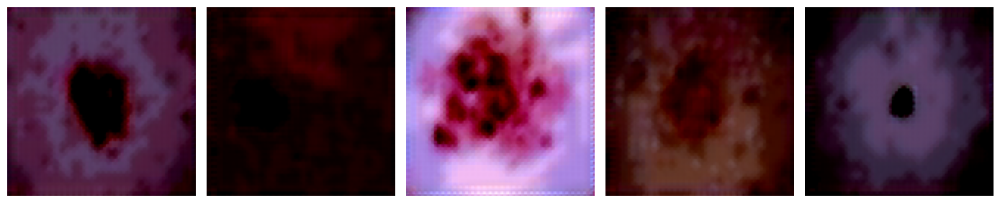

22000 iterations
recon_error: 0.050
perplexity: 72.218



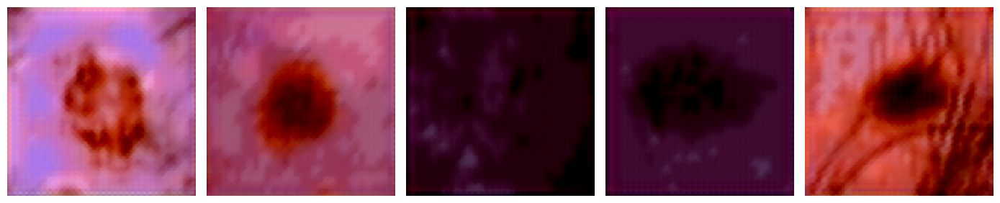

23000 iterations
recon_error: 0.027
perplexity: 76.784



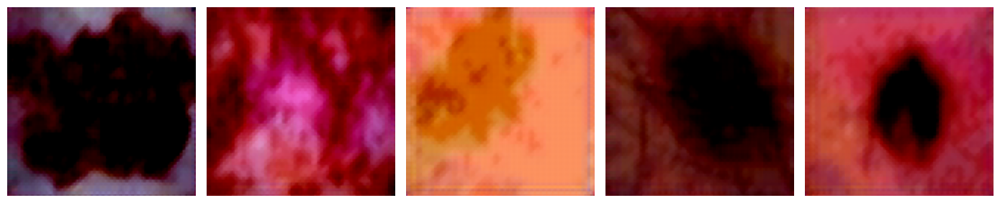

24000 iterations
recon_error: 0.027
perplexity: 77.875



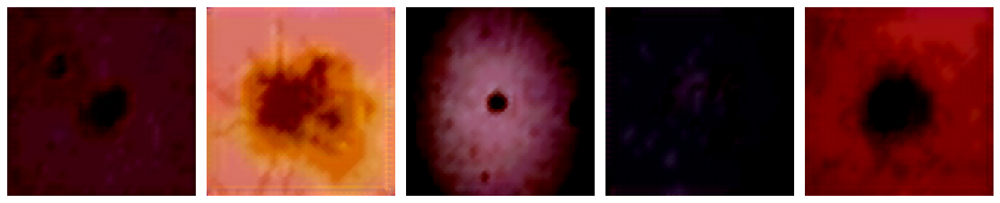

25000 iterations
recon_error: 0.023
perplexity: 77.078



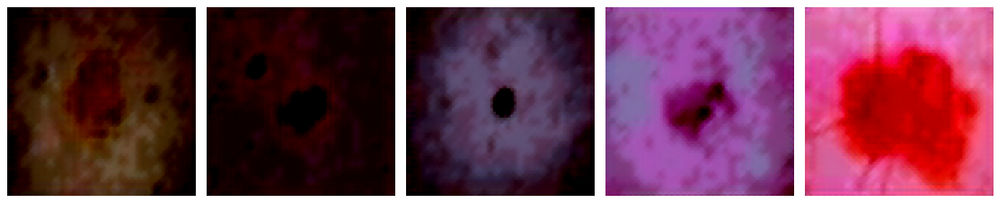

In [ ]:
model.train()
train_res_recon_error = []
train_res_perplexity = []

for i in range(num_training_updates):
    data = next(iter(train_loader))
    data = data.to(device)

    optimizer.zero_grad()

    vq_loss, data_recon, perplexity = model(data)
    recon_error = F.mse_loss(data_recon, data) / data_variance
    loss = recon_error + vq_loss
    loss.backward()

    optimizer.step()

    train_res_recon_error.append(recon_error.item())
    train_res_perplexity.append(perplexity.item())

    if (i+1) % 1000 == 0:
        print('%d iterations' % (i+1))
        print('recon_error: %.3f' % np.mean(train_res_recon_error[-100:]))
        print('perplexity: %.3f' % np.mean(train_res_perplexity[-100:]))
        print()

        wandb.log({'recon_error': np.mean(train_res_recon_error[-100:]), 'perplexity': np.mean(train_res_perplexity[-100:])})
        example_data = next(iter(train_loader))
        example_data = example_data.to(device)
        _, reconstructed_images, _ = model(example_data)
        reconstructed_images = reconstructed_images.cpu().detach().numpy()

        plt.figure(figsize=(14, 6))
        for j in range(5):
            plt.subplot(1, 5, j + 1)
            plt.imshow(reconstructed_images[j].transpose(1, 2, 0))
            plt.axis('off')
        plt.tight_layout()
        plt.show()

**Visualizing the Loss and Perplexity:**
___

In [ ]:
from scipy.signal import savgol_filter

In [ ]:
polyorder = 7

window_length_recon_error = min(201, len(train_res_recon_error))
window_length_perplexity = min(201, len(train_res_perplexity))

train_res_recon_error_smooth = savgol_filter(train_res_recon_error, window_length_recon_error, polyorder)
train_res_perplexity_smooth = savgol_filter(train_res_perplexity, window_length_perplexity, polyorder)

Text(0.5, 0, 'iteration')

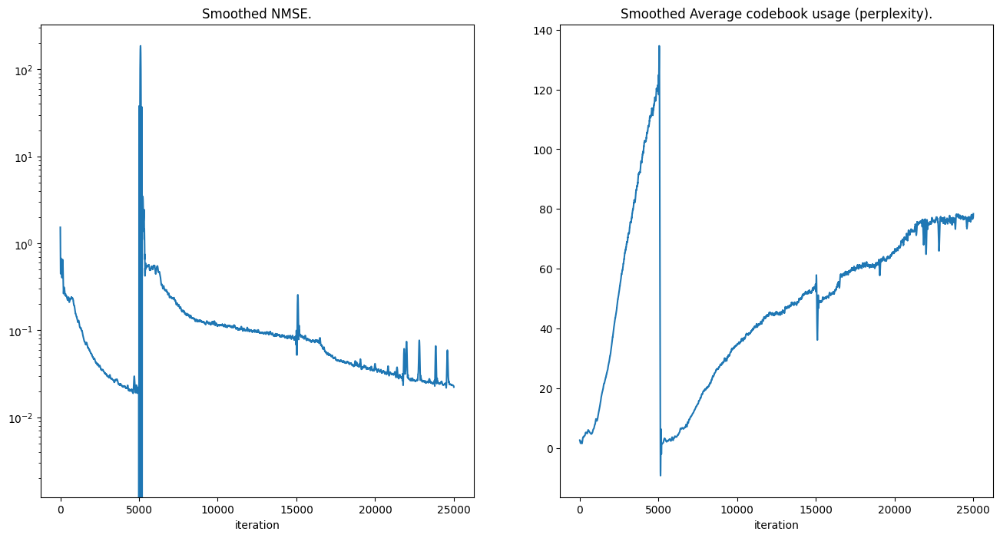

In [ ]:
f = plt.figure(figsize=(16,8))
ax = f.add_subplot(1,2,1)
ax.plot(train_res_recon_error_smooth)
ax.set_yscale('log')
ax.set_title('Smoothed NMSE.')
ax.set_xlabel('iteration')

ax = f.add_subplot(1,2,2)
ax.plot(train_res_perplexity_smooth)
ax.set_title('Smoothed Average codebook usage (perplexity).')
ax.set_xlabel('iteration')

**Testing Loop:**
___

In [ ]:
test_loader = DataLoader(test_dataset, batch_size = batch_size, shuffle=True)

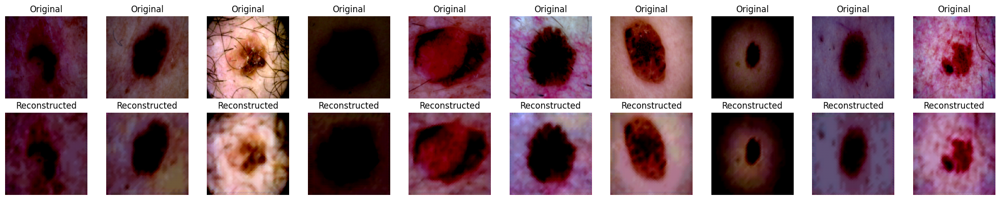

In [ ]:
model.eval()

test_originals = next(iter(test_loader))
test_originals = test_originals.to(device)

vq_output_eval = model._pre_vq_conv(model._encoder(test_originals))
_, test_quantize, _, _ = model._vq_vae(vq_output_eval)
test_reconstructions = model._decoder(test_quantize)

test_originals_np = test_originals.cpu().detach().numpy()
test_reconstructions_np = test_reconstructions.cpu().detach().numpy()

plt.figure(figsize=(20, 4))

for i in range(10):
    plt.subplot(2, 10, i + 1)
    plt.imshow(test_originals_np[i].transpose(1, 2, 0))
    plt.title("Original")
    plt.axis("off")

# Plot reconstructed images
for i in range(10):
    plt.subplot(2, 10, i + 11)
    plt.imshow(test_reconstructions_np[i].transpose(1, 2, 0))
    plt.title("Reconstructed")
    plt.axis("off")

plt.tight_layout()  # Adjust spacing between subplots
plt.show()

wandb.log({
    "original_images": [wandb.Image(img.transpose(1, 2, 0)) for img in test_originals_np[:10]],
    "reconstructed_images": [wandb.Image(img.transpose(1, 2, 0)) for img in test_reconstructions_np[:10]]
})

In [ ]:
vq_output_eval[0].shape

torch.Size([64, 32, 32])

In [ ]:
test_reconstructions[0].shape

torch.Size([3, 128, 128])

In [ ]:
train_originals = next(iter(train_loader))
train_originals = train_originals.to(device)
_, train_reconstructions, _, _ = model._vq_vae(train_originals)

In [ ]:
train_originals = next(iter(train_loader))
train_originals = train_originals.to(device)
_, train_reconstructions, _, _ = model._vq_vae(train_originals)

In [ ]:
def show(reconstructions, originals, count):
    batch_size = reconstructions.size(0)

    fig, axs = plt.subplots(count, 2, figsize=(10, count * 10))

    for i in range(count):
        np_recon = reconstructions[i].cpu().numpy().transpose((1, 2, 0))
        np_orig = originals[i].cpu().numpy().transpose((1, 2, 0))

        axs[i, 0].imshow(np_recon + 0.5, interpolation='nearest')
        axs[i, 0].axis('off')
        axs[i, 0].set_title('Reconstruction')

        axs[i, 1].imshow(np_orig + 0.5, interpolation='nearest')
        axs[i, 1].axis('off')
        axs[i, 1].set_title('Original')

    plt.show()

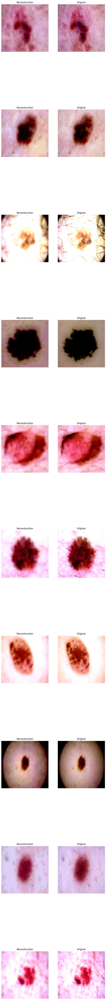

In [ ]:
show(test_reconstructions.cpu().data, test_originals.cpu(), 10)

**Saving the model:**
___

In [ ]:
import umap

2024-04-29 21:56:06.857190: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-29 21:56:06.857291: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-29 21:56:07.011174: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [ ]:
proj = umap.UMAP(n_neighbors=3,
                 min_dist=0.1,
                 metric='cosine').fit_transform(model._vq_vae._embedding.weight.data.cpu())

In [ ]:
torch.save(model.state_dict(), 'VQVAE_25000.pth')

In [ ]:
torch.save(model.state_dict(), 'VQVAE_final.pth')

# **Auto-Regression Model (PixelCNN):**
___

In [ ]:
vqvae_model = Model(num_hiddens, embedding_dim, commitment_cost, decay)
vqvae_model.load_state_dict(torch.load('/content/VQVAE__10000_2.pth'))
vqvae_model = vqvae_model.to(device)
vqvae_model.eval()

Model(
  (_pre_vq_conv): Conv2d(128, 64, kernel_size=(1, 1), stride=(1, 1))
  (_encoder): Encoder(
    (_conv_1): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (_conv_2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (_conv_3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
  (_vq_vae): VectorQuantizer(
    (_embedding): Embedding(512, 64)
  )
  (_decoder): Decoder(
    (_conv_1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (_conv_trans_1): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (_conv_trans_2): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  )
)

In [ ]:
class PixelCNN(nn.Module):
    def __init__(self, in_channels=3, out_channels=3, num_filters=64, num_layers=5):
        super(PixelCNN, self).__init__()
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.num_filters = num_filters
        self.num_layers = num_layers

        self.conv1 = nn.Conv2d(in_channels, num_filters, kernel_size=7, padding=3)

        self.layers = nn.ModuleList()
        for _ in range(num_layers):
            self.layers.append(nn.Conv2d(num_filters, num_filters, kernel_size=3, padding=1))

        self.conv2 = nn.Conv2d(num_filters, out_channels, kernel_size=1)

    def forward(self, x):
        x = self.conv1(x)
        x = F.relu(x)

        for layer in self.layers:
            x = layer(x)
            x = F.relu(x)

        x = self.conv2(x)
        return x

In [ ]:
pixel_cnn_model = PixelCNN()
pixel_cnn_model.to(device)

pix_criterion = nn.CrossEntropyLoss()
pix_optimizer = Adam(pixel_cnn_model.parameters(), lr=learning_rate)

Epoch 1/100, Loss: 0.8068028390407562


Epoch 2/100, Loss: 0.9348743259906769


Epoch 3/100, Loss: 0.8509993255138397


Epoch 4/100, Loss: 0.841698169708252


Epoch 5/100, Loss: 0.8513760268688202


Epoch 6/100, Loss: 1.0205166339874268


Epoch 7/100, Loss: 0.9594257473945618


Epoch 8/100, Loss: 0.9175784587860107


Epoch 9/100, Loss: 0.6183770596981049


Epoch 10/100, Loss: 1.314590871334076


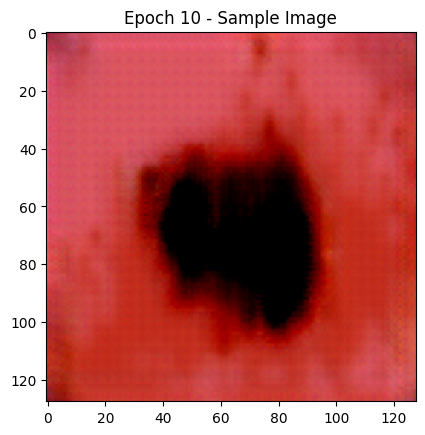

Epoch 11/100, Loss: 1.0731463432312012


Epoch 12/100, Loss: 0.9194119572639465


Epoch 13/100, Loss: 0.8847577571868896


Epoch 14/100, Loss: 0.8442442119121552


Epoch 15/100, Loss: 0.797252893447876


Epoch 16/100, Loss: 1.178672194480896


Epoch 17/100, Loss: 0.9123132526874542


Epoch 18/100, Loss: 0.8520156443119049


Epoch 19/100, Loss: 0.5906869024038315


Epoch 20/100, Loss: 0.9108179807662964


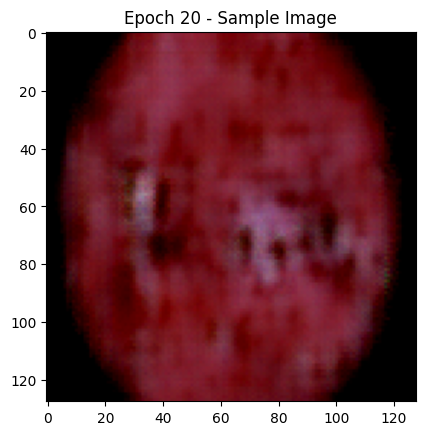

Epoch 21/100, Loss: 0.7607476115226746


Epoch 22/100, Loss: 0.7616739869117737


Epoch 23/100, Loss: 0.9196354150772095


Epoch 24/100, Loss: 0.7422424852848053


Epoch 25/100, Loss: 1.044960618019104


Epoch 26/100, Loss: 0.8531156778335571


Epoch 27/100, Loss: 1.1439310312271118


Epoch 28/100, Loss: 0.9168380796909332


Epoch 29/100, Loss: 0.9088008999824524


Epoch 30/100, Loss: 0.7354929149150848


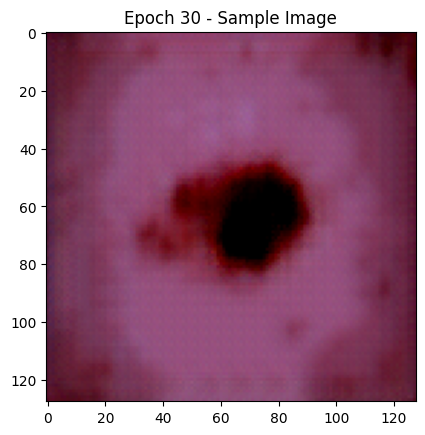

Epoch 31/100, Loss: 0.9783052802085876


Epoch 32/100, Loss: 1.0284862518310547


Epoch 33/100, Loss: 0.6782378554344177


Epoch 34/100, Loss: 0.9400819540023804


Epoch 35/100, Loss: 0.8022356927394867


Epoch 36/100, Loss: 0.7302905768156052


Epoch 37/100, Loss: 0.9111933708190918


Epoch 38/100, Loss: 1.1662188470363617


Epoch 39/100, Loss: 0.933867335319519


Epoch 40/100, Loss: 1.2422023713588715


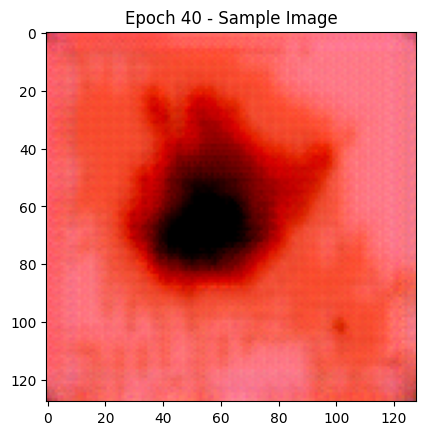

Epoch 41/100, Loss: 0.8537578284740448


Epoch 42/100, Loss: 0.8103179931640625


Epoch 43/100, Loss: 1.0558951497077942


Epoch 44/100, Loss: 0.9820424318313599


Epoch 45/100, Loss: 0.7289598882198334


Epoch 46/100, Loss: 0.8533226549625397


Epoch 47/100, Loss: 1.0049540996551514


Epoch 48/100, Loss: 1.0609889030456543


Epoch 49/100, Loss: 0.8619639575481415


Epoch 50/100, Loss: 0.9989652037620544


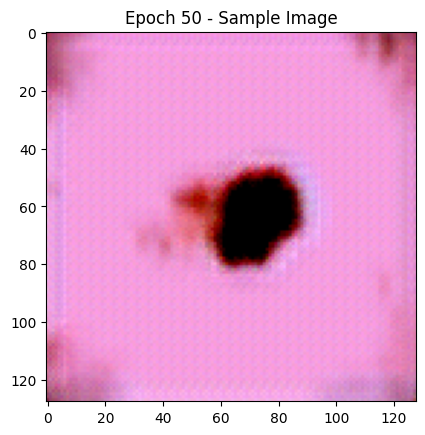

Epoch 51/100, Loss: 0.7528369724750519


Epoch 52/100, Loss: 0.9180506765842438


Epoch 53/100, Loss: 0.9386996030807495


Epoch 54/100, Loss: 0.8103716969490051


Epoch 55/100, Loss: 1.0181464850902557


Epoch 56/100, Loss: 1.1840666234493256


Epoch 57/100, Loss: 0.9270225763320923


Epoch 58/100, Loss: 1.1559107899665833


Epoch 59/100, Loss: 0.7840242832899094


Epoch 60/100, Loss: 1.177961677312851


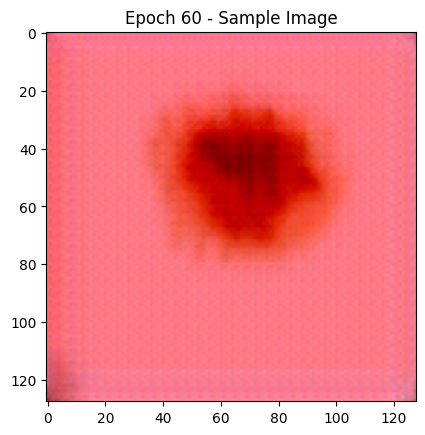

Epoch 61/100, Loss: 0.7120261192321777


Epoch 62/100, Loss: 0.8318747282028198


Epoch 63/100, Loss: 0.8918730616569519


Epoch 64/100, Loss: 0.9748618304729462


Epoch 65/100, Loss: 1.1787484288215637


Epoch 66/100, Loss: 0.7084837555885315


Epoch 67/100, Loss: 0.8889406025409698


Epoch 68/100, Loss: 0.769178718328476


Epoch 69/100, Loss: 0.90765181183815


Epoch 70/100, Loss: 0.8543894588947296


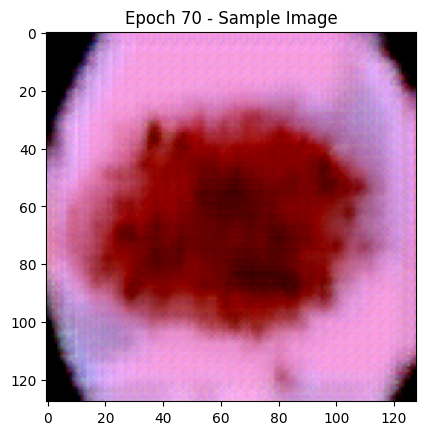

Epoch 71/100, Loss: 0.8713122606277466


Epoch 72/100, Loss: 1.0466000437736511


Epoch 73/100, Loss: 1.0749274790287018


Epoch 74/100, Loss: 0.9490070641040802


Epoch 75/100, Loss: 0.7899853587150574


Epoch 76/100, Loss: 0.9120512902736664


Epoch 77/100, Loss: 0.8212224245071411


Epoch 78/100, Loss: 1.068217784166336


Epoch 79/100, Loss: 0.9131395518779755


Epoch 80/100, Loss: 0.8579266667366028


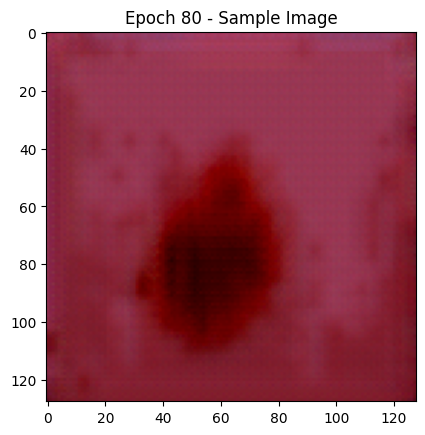

Epoch 81/100, Loss: 0.7488524317741394


Epoch 82/100, Loss: 0.7819814085960388


Epoch 83/100, Loss: 1.058084785938263


Epoch 84/100, Loss: 1.067432165145874


Epoch 85/100, Loss: 0.772382915019989


Epoch 86/100, Loss: 1.2327305674552917


Epoch 87/100, Loss: 0.6775364577770233


Epoch 88/100, Loss: 1.1232571005821228


Epoch 89/100, Loss: 0.9977473616600037


Epoch 90/100, Loss: 0.6743179857730865


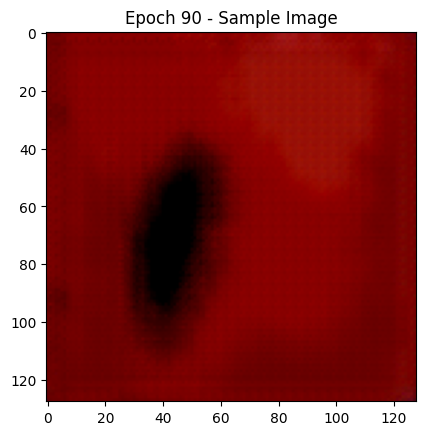

Epoch 91/100, Loss: 0.8412571251392365


Epoch 92/100, Loss: 0.8082800209522247


Epoch 93/100, Loss: 0.927386611700058


Epoch 94/100, Loss: 0.737990602850914


Epoch 95/100, Loss: 1.1099196672439575


Epoch 96/100, Loss: 0.9310095310211182


Epoch 97/100, Loss: 0.7474251091480255


Epoch 98/100, Loss: 1.2086355090141296


Epoch 99/100, Loss: 0.9372013509273529


Epoch 100/100, Loss: 0.9291530251502991


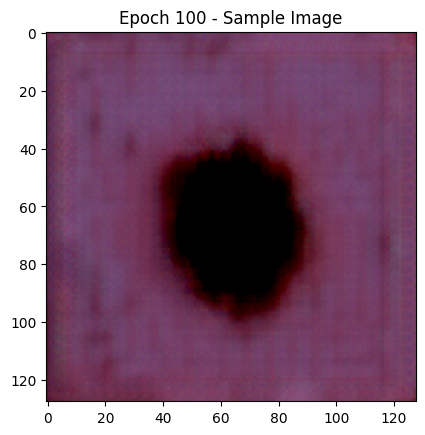

In [ ]:
import matplotlib.pyplot as plt
from tqdm import tqdm
num_epochs = 100
for epoch in range(num_epochs):
    model.eval()
    pixel_cnn_model.train()
    total_loss = 0.0
    for data in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}", leave=False):
        inputs= data
        inputs = inputs.to(device)
        with torch.no_grad():
            out = model._pre_vq_conv(model._encoder(inputs))
            _, quantize, _, _ = model._vq_vae(out)
            quantized = model._decoder(quantize)
        outputs = pixel_cnn_model(quantized)
        loss = pix_criterion(outputs, inputs)
        total_loss += loss.item()
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    wandb.log({"training_loss": total_loss / len(train_loader), "epoch": epoch+1})

    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {total_loss / len(train_loader)}")

    if (epoch + 1) % 10 == 0:
        sample = quantized[0].cpu().detach().numpy()
        plt.imshow(sample.transpose(1, 2, 0))
        plt.title(f'Epoch {epoch+1} - Sample Image')
        plt.show()

In [ ]:
torch.save(pixel_cnn_model.state_dict(), 'pixel_final.pth')

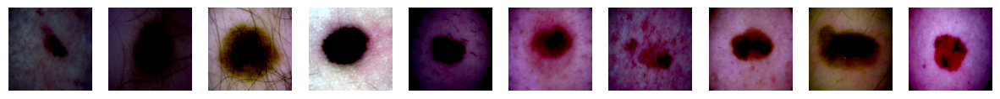

Average test loss: 0.6543425619602203


In [ ]:
import matplotlib.pyplot as plt

model.eval()
pixel_cnn_model.eval()

plot_counter = 0

plt.figure(figsize=(15, 3))

with torch.no_grad():
    test_losses = []
    for data in test_loader:
        inputs = data.to(device)
        out = model._pre_vq_conv(model._encoder(inputs))
        _, quantize, _, _ = model._vq_vae(out)
        quantized = model._decoder(quantize)
        outputs = pixel_cnn_model(quantized)

        loss = pix_criterion(outputs, inputs)
        test_losses.append(loss.item())

        for i in range(inputs.size(0)):
            if plot_counter < 10:
                plt.subplot(1, 10, plot_counter+1)
                plt.imshow(inputs[i].cpu().detach().numpy().transpose(1, 2, 0))
                plt.axis('off')
                plot_counter += 1
            else:
                break

plt.show()

average_test_loss = sum(test_losses) / len(test_losses)
print(f"Average test loss: {average_test_loss}")